In [ ]:
import torch, torchvision, torchaudio
print("torch:", torch.__version__, "| cuda:", torch.version.cuda)
from google.colab import drive
drive.flush_and_unmount()         # unmount if already mounted
!rm -rf /content/drive            # clear old directory handle
drive.mount('/content/drive', force_remount=True)



import os, cv2, glob, random, math
import numpy as np
from glob import glob as glob_glob
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader


image_dir = "/content/drive/MyDrive/dataset/images"
mask_dir  = "/content/drive/MyDrive/dataset/fnet_masks"
os.makedirs(mask_dir, exist_ok=True)

def load_bgr_png(path):
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None:
        raise ValueError(f"Cannot read: {path}")
    if img.ndim == 3 and img.shape[2] == 4:
        img = img[:, :, :3]
    if img.ndim == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    return img

def build_mask(bgr):
    H, W = bgr.shape[:2]
    b, g, r = cv2.split(bgr)

    near_white = (r > 240) & (g > 240) & (b > 240)

    denom = (r.astype(np.float32) + g.astype(np.float32) + b.astype(np.float32) + 1e-6)
    redness = r.astype(np.float32) / denom

    red8 = np.uint8(np.clip(redness*255, 0, 255))
    thr, _ = cv2.threshold(red8, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    thr_scaled = int(thr * 0.95)
    mask = (red8 >= thr_scaled).astype(np.uint8) * 255

    mask[near_white] = 0

    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k, iterations=1)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k, iterations=3)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask[:] = 0
    cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)

    num, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    min_area = max(400, int(0.001 * H * W))
    keep = np.zeros(num, dtype=bool)
    for i in range(1, num):
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            keep[i] = True
    out = np.zeros_like(mask)
    out[np.isin(labels, np.where(keep)[0])] = 255
    return out

pngs = glob_glob(os.path.join(image_dir, "*.png"))
print(f"Found {len(pngs)} PNGs in {image_dir}")

for p in tqdm(pngs):
    bgr  = load_bgr_png(p)
    mask = build_mask(bgr)
    base = os.path.splitext(os.path.basename(p))[0]
    cv2.imwrite(os.path.join(mask_dir, f"{base}_mask.png"), mask)

print("Done! ->", mask_dir)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

IMAGE_DIR = "/content/drive/MyDrive/dataset/images"
MASK_DIR  = "/content/drive/MyDrive/dataset/fnet_masks"
SAVE_DIR  = "/content/drive/MyDrive/dataset/models"
os.makedirs(SAVE_DIR, exist_ok=True)

IMG_SIZE      = 256
BATCH_SIZE    = 8
EPOCHS        = 10
LR            = 2e-4
VAL_SPLIT     = 0.2
SEED          = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

def read_rgb(path):
    im = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if im is None:
        raise ValueError(f"Failed to read: {path}")
    if im.ndim == 2:
        im = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)
    if im.shape[2] == 4:
        im = im[:, :, :3]
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    return im

def read_mask(path):
    m = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if m is None:
        raise ValueError(f"Failed to read mask: {path}")
    return m

def list_pairs(image_dir, mask_dir):
    img_paths = sorted(glob_glob(os.path.join(image_dir, "*.png")))
    pairs = []
    for ip in img_paths:
        base = os.path.splitext(os.path.basename(ip))[0]
        mp = os.path.join(mask_dir, f"{base}_mask.png")
        if os.path.exists(mp):
            pairs.append((ip, mp))
    return pairs

pairs = list_pairs(IMAGE_DIR, MASK_DIR)
print(f"Found {len(pairs)} (image, mask) pairs")

class SegDataset(Dataset):
    def __init__(self, pairs, img_size=256, augment=False):
        self.pairs = pairs
        self.img_size = img_size
        self.augment = augment
    def __len__(self):
        return len(self.pairs)
    def __getitem__(self, idx):
        ip, mp = self.pairs[idx]
        img = read_rgb(ip)
        msk = read_mask(mp)

        img_r = cv2.resize(img, (self.img_size, self.img_size), interpolation=cv2.INTER_AREA)
        msk_r = cv2.resize(msk, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        if self.augment and random.random() < 0.5:
            img_r = np.ascontiguousarray(np.flip(img_r, axis=1))
            msk_r = np.ascontiguousarray(np.flip(msk_r, axis=1))
        if self.augment and random.random() < 0.2:
            img_r = np.ascontiguousarray(np.flip(img_r, axis=0))
            msk_r = np.ascontiguousarray(np.flip(msk_r, axis=0))

        img_t = torch.from_numpy(img_r.transpose(2,0,1)).float() / 255.0
        msk_t = torch.from_numpy((msk_r > 127).astype(np.float32)).unsqueeze(0)
        return img_t, msk_t, os.path.basename(ip)


N = len(pairs)
idxs = list(range(N))
random.shuffle(idxs)
cut = int((1.0 - VAL_SPLIT) * N)
train_idx, val_idx = idxs[:cut], idxs[cut:]
train_pairs = [pairs[i] for i in train_idx]
val_pairs   = [pairs[i] for i in val_idx]
print(f"Train: {len(train_pairs)}, Val: {len(val_pairs)}")

train_ds = SegDataset(train_pairs, IMG_SIZE, augment=True)
val_ds   = SegDataset(val_pairs,   IMG_SIZE, augment=False)

train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                      num_workers=2, pin_memory=(DEVICE=="cuda"))
val_dl   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False,
                      num_workers=2, pin_memory=(DEVICE=="cuda"))

class DiceLoss(nn.Module):
    def __init__(self, eps=1e-6):
        super().__init__()
        self.eps = eps
    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        num = 2 * (probs*targets).sum(dim=(2,3)) + self.eps
        den = probs.sum(dim=(2,3)) + targets.sum(dim=(2,3)) + self.eps
        return (1 - num/den).mean()

def dice_coeff(logits, targets, thr=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs > thr).float()
    num = 2 * (preds*targets).sum(dim=(2,3)) + eps
    den = preds.sum(dim=(2,3)) + targets.sum(dim=(2,3)) + eps
    return (num/den).mean().item()


class FAMBlock(nn.Module):
    def __init__(self, channels):
        super(FAMBlock, self).__init__()
        self.conv3 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=1)
        self.relu  = nn.ReLU(inplace=True)
    def forward(self, x):
        x3 = self.relu(self.conv3(x))
        x1 = self.relu(self.conv1(x))
        return x3 + x1

class DecoderBottleneckLayer(nn.Module):
    def __init__(self, in_channels, out_channels, use_transpose=True):
        super(DecoderBottleneckLayer, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels // 4, 1)
        self.bn1   = nn.BatchNorm2d(in_channels // 4)
        self.relu1 = nn.ReLU(inplace=True)
        if use_transpose:
            self.up = nn.Sequential(
                nn.ConvTranspose2d(in_channels // 4, in_channels // 4, 3, stride=2, padding=1, output_padding=1),
                nn.BatchNorm2d(in_channels // 4),
                nn.ReLU(inplace=True)
            )
        else:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv3 = nn.Conv2d(in_channels // 4, out_channels, 1)
        self.bn3   = nn.BatchNorm2d(out_channels)
        self.relu3 = nn.ReLU(inplace=True)
    def forward(self, x):
        x = self.relu1(self.bn1(self.conv1(x)))
        x = self.up(x)
        x = self.relu3(self.bn3(self.conv3(x)))
        return x

class SEBlock(nn.Module):
    def __init__(self, channel, r=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // r, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // r, channel, bias=False),
            nn.Sigmoid(),
        )
    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y


class FAT_Net(nn.Module):
    def __init__(self, n_channels=3, n_classes=1, tf_in_size=224):
        super(FAT_Net, self).__init__()
        self.tf_in_size = tf_in_size

        # Backbones
        self.transformer = torch.hub.load(
            'facebookresearch/deit:main',
            'deit_tiny_distilled_patch16_224',
            pretrained=True
        )
        resnet = torchvision.models.resnet34(pretrained=True)

        # ImageNet normalization for BOTH branches
        self.register_buffer("imnet_mean", torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1))
        self.register_buffer("imnet_std",  torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1))

        # ResNet encoder
        self.firstconv = resnet.conv1
        self.firstbn   = resnet.bn1
        self.firstrelu = resnet.relu
        self.maxpool   = resnet.maxpool
        self.encoder1  = resnet.layer1
        self.encoder2  = resnet.layer2
        self.encoder3  = resnet.layer3
        self.encoder4  = resnet.layer4

        # DeiT parts
        self.patch_embed = self.transformer.patch_embed
        self.tf_blocks   = nn.ModuleList([self.transformer.blocks[i] for i in range(12)])
        self.tf_norm     = self.transformer.norm
        self.cls_token   = self.transformer.cls_token
        self.dist_token  = getattr(self.transformer, "dist_token", None)
        self.pos_embed   = self.transformer.pos_embed
        self.pos_drop    = self.transformer.pos_drop
        self.conv_seq_img = nn.Conv2d(192, 512, kernel_size=1)  # 192 -> 512

        # Fusion
        self.se = SEBlock(channel=1024)
        self.conv2d = nn.Conv2d(1024, 512, kernel_size=1)

        # FAM refinements
        self.FAM1 = nn.ModuleList([FAMBlock(64)  for _ in range(6)])
        self.FAM2 = nn.ModuleList([FAMBlock(128) for _ in range(4)])
        self.FAM3 = nn.ModuleList([FAMBlock(256) for _ in range(2)])

        # Decoder
        self.decoder4 = DecoderBottleneckLayer(512, 256)
        self.decoder3 = DecoderBottleneckLayer(256, 128)
        self.decoder2 = DecoderBottleneckLayer(128, 64)
        self.decoder1 = DecoderBottleneckLayer(64,  64)

        # Heads
        self.final_conv1 = nn.ConvTranspose2d(64, 32, 4, 2, 1)
        self.final_relu1 = nn.ReLU(inplace=True)
        self.final_conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.final_relu2 = nn.ReLU(inplace=True)
        self.final_conv3 = nn.Conv2d(32, n_classes, 3, padding=1)

    @staticmethod
    def _tokens_to_map(tokens):
        """
        Converts token features (from transformer output) to a spatial feature map.
        Assumes `tokens` is of shape (B, N, C), where:
        - B: Batch size
        - N: Number of tokens
        - C: Number of channels
        """
        B, N, C = tokens.shape
        s = int(round(N ** 0.5))  # Calculate the spatial size (assumes square tokens)

        if s * s != N:
            tokens = tokens[:, : s*s, :]

        return tokens.permute(0, 2, 1).reshape(B, C, s, s)

    def _deit_feature_map(self, x224):
        B = x224.shape[0]
        x = self.patch_embed(x224)  # [B, N, 192]

        cls = self.cls_token.expand(B, -1, -1)  # [B, 1, 192]
        if self.dist_token is not None:  # For distilled transformers
            dist = self.dist_token.expand(B, -1, -1)
            x = torch.cat((cls, dist, x), dim=1)  # [B, 2+N, 192]
        else:
            x = torch.cat((cls, x), dim=1)  # [B, 1+N, 192]

        x = x + self.pos_embed
        x = self.pos_drop(x)

        for blk in self.tf_blocks:  # Transformer blocks
            x = blk(x)
        x = self.tf_norm(x)

        start = 2 if self.dist_token is not None else 1
        x = x[:, start:, :]  # [B, N, 192]

        # Using _tokens_to_map to convert the tokens into spatial features
        x = FAT_Net._tokens_to_map(x)  # Correct usage of static method without self
 # [B, 192, 14, 14] spatial map

        x = self.conv_seq_img(x)  # [B, 512, 14, 14]
        return x

    def _normalize(self, x):
        return (x - self.imnet_mean) / self.imnet_std


    def forward(self, x):
        # Normalize once
        x_norm = self._normalize(x)

        # CNN encoder at native size (e.g., 256)
        e0  = self.firstrelu(self.firstbn(self.firstconv(x_norm)))
        e0p = self.maxpool(e0)
        e1  = self.encoder1(e0p)   # 64
        e2  = self.encoder2(e1)    # 128
        e3  = self.encoder3(e2)    # 256
        e4  = self.encoder4(e3)    # 512

        # DeiT at 224x224
        x_tf = F.interpolate(x_norm, size=(self.tf_in_size, self.tf_in_size),
                             mode="bilinear", align_corners=False)
        feature_tf = self._deit_feature_map(x_tf)   # [B, 512, 14, 14]

        # Align to e4 spatial size
        if feature_tf.shape[2:] != e4.shape[2:]:
            feature_tf = F.interpolate(feature_tf, size=e4.shape[2:],
                                       mode="bilinear", align_corners=False)

        # SE fusion
        fused = torch.cat((e4, feature_tf), dim=1)  # [B, 1024, ...]
        fused = self.se(fused)
        fused = self.conv2d(fused)                  # [B, 512, ...]

        # FAM-refine skips
        for fam in self.FAM3: e3 = fam(e3)
        for fam in self.FAM2: e2 = fam(e2)
        for fam in self.FAM1: e1 = fam(e1)

        # Decoder with additive skips
        d4 = self.decoder4(fused) + e3
        d3 = self.decoder3(d4)   + e2
        d2 = self.decoder2(d3)   + e1
        d1 = self.decoder1(d2)

        out = self.final_conv1(d1)
        out = self.final_relu1(out)
        out = self.final_conv2(out)
        out = self.final_relu2(out)
        out = self.final_conv3(out)                 # logits [B,1,H,W]
        return out


def estimate_foreground_prior(loader, max_batches=50):
    pos = 0.0; tot = 0.0
    for i, (_, msks, _) in enumerate(loader):
        pos += msks.sum().item()
        tot += msks.numel()
        if i + 1 >= max_batches:
            break
    prior = max(pos / max(tot, 1.0), 1e-6)
    return prior

fg_prior = estimate_foreground_prior(train_dl)
pos_w = (1.0 - fg_prior) / fg_prior
print(f"[Class balance] foreground prior ≈ {fg_prior:.4f}  ->  pos_weight = {pos_w:.2f}")

# Model
model = FAT_Net(n_channels=3, n_classes=1).to(DEVICE)


with torch.no_grad():
    b = math.log(fg_prior / (1.0 - fg_prior))
    if hasattr(model, "final_conv3") and model.final_conv3.bias is not None:
        model.final_conv3.bias.fill_(b)
        print(f"[Init] final_conv3.bias set to {b:.3f} (logit of prior)")


criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_w], device=DEVICE))


head_params = list(model.final_conv1.parameters()) + list(model.final_conv2.parameters()) + list(model.final_conv3.parameters())
backbone_params = [p for n,p in model.named_parameters()
                   if not (n.startswith("final_conv1") or n.startswith("final_conv2") or n.startswith("final_conv3"))]
optimizer = torch.optim.AdamW(
    [{"params": backbone_params, "lr": LR},
     {"params": head_params,    "lr": LR*5}],
)

scaler = None  # CPU


def run_epoch(loader, train=True):
    model.train(mode=train)
    total_loss, total_dice, n = 0.0, 0.0, 0
    for imgs, masks, _ in loader:
        imgs  = imgs.to(DEVICE, non_blocking=False)
        masks = masks.to(DEVICE, non_blocking=False)

        if train:
            optimizer.zero_grad(set_to_none=True)

        logits = model(imgs)
        loss = criterion(logits, masks)

        if train:
            loss.backward()
            optimizer.step()

        total_loss += loss.item() * imgs.size(0)
        total_dice += dice_coeff(logits.detach(), masks.detach()) * imgs.size(0)
        n += imgs.size(0)

    return total_loss/n, total_dice/n

best_val = -1.0
saved_any = False
for ep in range(1, EPOCHS+1):
    tr_loss, tr_dice = run_epoch(train_dl, train=True)
    va_loss, va_dice = run_epoch(val_dl,   train=False)

    # Always save on epoch 1; then save on improvement
    if ep == 1 or va_dice >= best_val:
        best_val = va_dice
        torch.save(model.state_dict(), os.path.join(SAVE_DIR, "fatnet_best.pt"))
        saved_any = True

    print(f"[{ep:02d}/{EPOCHS}] train_loss={tr_loss:.4f} dice={tr_dice:.4f} | "
          f"val_loss={va_loss:.4f} dice={va_dice:.4f} (best={best_val:.4f})")

if saved_any:
    model.load_state_dict(torch.load(os.path.join(SAVE_DIR, "fatnet_best.pt"), map_location=DEVICE))
model.eval()
print("Loaded best FAT-Net checkpoint.")

torch: 2.8.0+cu126 | cuda: 12.6
Mounted at /content/drive
Found 29 PNGs in /content/drive/MyDrive/dataset/images


100%|██████████| 29/29 [00:01<00:00, 22.24it/s]


Done! -> /content/drive/MyDrive/dataset/fnet_masks
Device: cpu
Found 29 (image, mask) pairs
Train: 23, Val: 6
[Class balance] foreground prior ≈ 0.2380  ->  pos_weight = 3.20


Using cache found in /root/.cache/torch/hub/facebookresearch_deit_main


[Init] final_conv3.bias set to -1.164 (logit of prior)
[01/10] train_loss=1.2809 dice=0.0000 | val_loss=1.4530 dice=0.0000 (best=0.0000)
[02/10] train_loss=1.0840 dice=0.0444 | val_loss=1.3749 dice=0.0000 (best=0.0000)
[03/10] train_loss=0.7920 dice=0.6554 | val_loss=1.2651 dice=0.0000 (best=0.0000)
[04/10] train_loss=0.6175 dice=0.7448 | val_loss=1.2428 dice=0.0000 (best=0.0000)
[05/10] train_loss=0.5113 dice=0.8255 | val_loss=1.1480 dice=0.0000 (best=0.0000)
[06/10] train_loss=0.4692 dice=0.8251 | val_loss=0.8557 dice=0.7431 (best=0.7431)
[07/10] train_loss=0.4100 dice=0.8550 | val_loss=0.7330 dice=0.8565 (best=0.8565)
[08/10] train_loss=0.3944 dice=0.8650 | val_loss=0.6229 dice=0.8734 (best=0.8734)
[09/10] train_loss=0.3669 dice=0.8741 | val_loss=0.4624 dice=0.8776 (best=0.8776)
[10/10] train_loss=0.3663 dice=0.8512 | val_loss=0.4018 dice=0.8423 (best=0.8776)
Loaded best FAT-Net checkpoint.


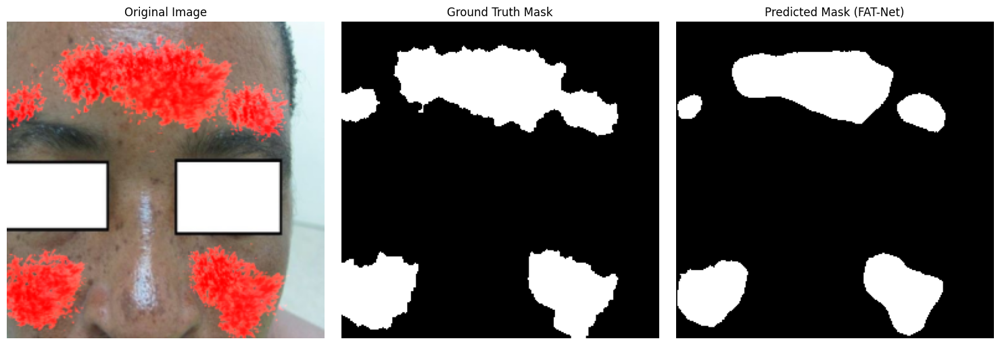

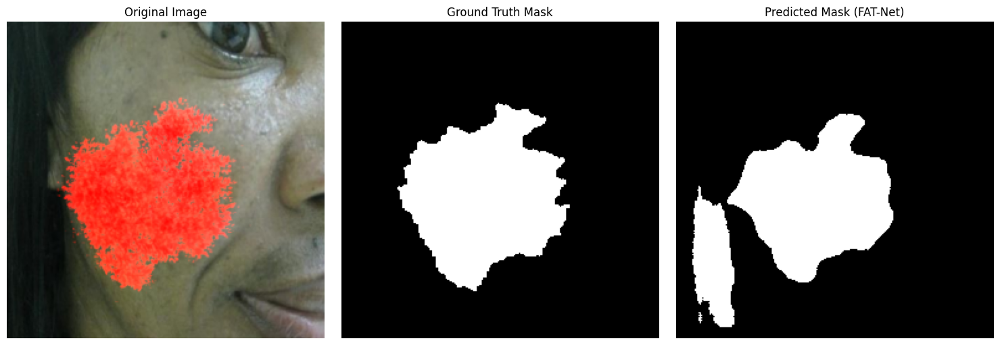

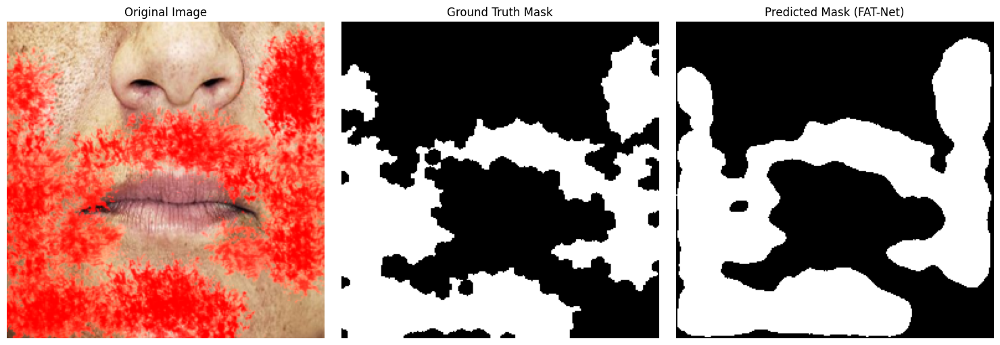

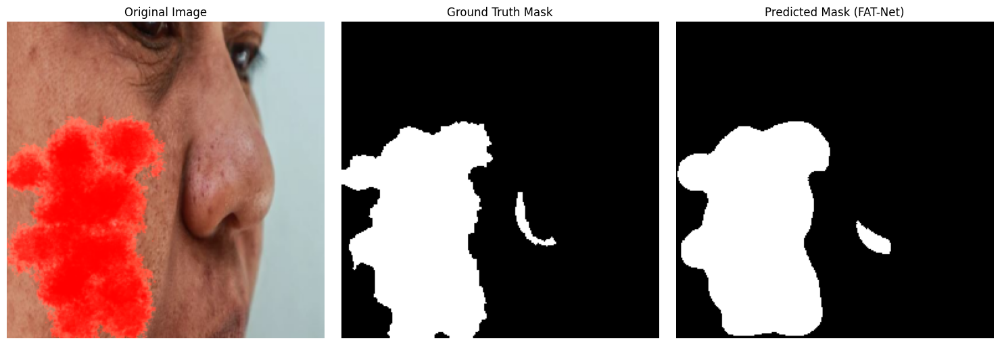

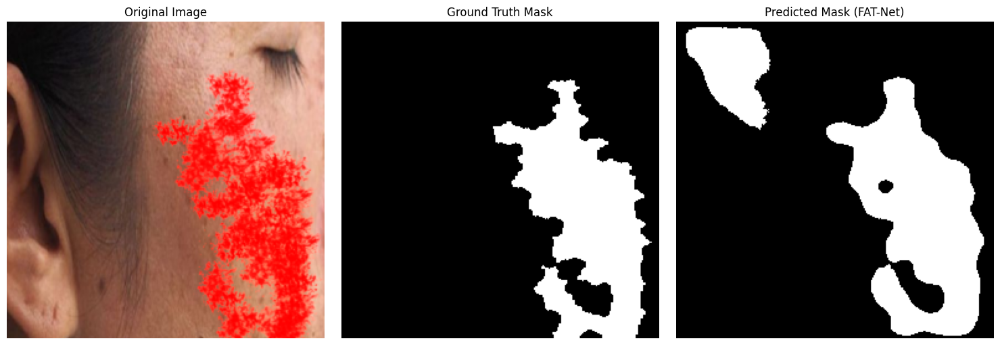

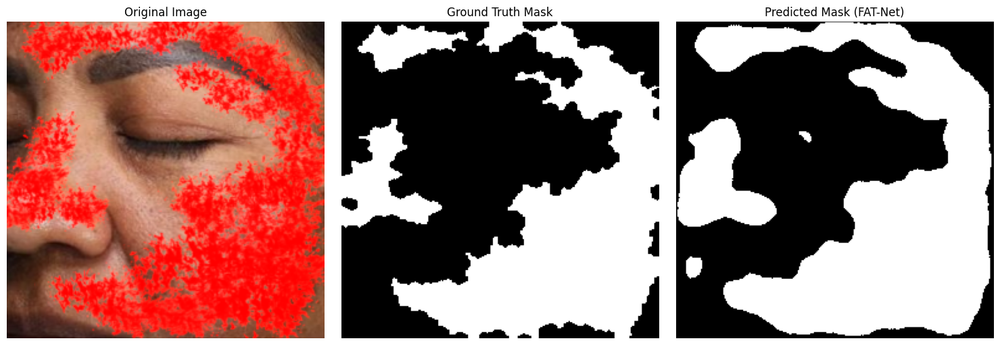

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

# Function to visualize segmentation for all images in the dataset
def visualize_all_segmentation(dataloader, model, device, thr=0.5, n_images=52):
    """
    Visualizes the segmentation of the original image, ground truth mask, and predicted mask
    for a batch of images from the DataLoader.

    Parameters:
        dataloader (DataLoader): The DataLoader to fetch images and masks.
        model (nn.Module): The trained model to get predictions.
        device (torch.device): The device (CPU or GPU) to perform computations.
        thr (float): The threshold for binarizing the predicted mask.
        n_images (int): Number of images to visualize in a batch.
    """
    model.eval()  # Set model to evaluation mode
    model = model.to(device)  # Ensure the model is on the correct device
    with torch.no_grad():  # Disable gradient computation
        for imgs, msks, names in dataloader:
            imgs = imgs.to(device)
            msks = msks.to(device)

            # Get predictions from the model
            predicted_mask = model(imgs)

            # Loop through the images and visualize
            for i in range(min(n_images, imgs.size(0))):  # Visualize n_images images
                img = imgs[i]
                ground_truth_mask = msks[i]
                predicted_mask_single = predicted_mask[i]

                # Visualize segmentation
                visualize_segmentation(img, ground_truth_mask, predicted_mask_single, thr=thr)

# Visualization function for a single image
@torch.no_grad()
def visualize_segmentation(img, ground_truth_mask, predicted_mask, thr=0.5):
    """
    Visualize the original image, ground truth mask, and predicted mask from FAT-Net.

    Parameters:
        img (Tensor): The original image (C, H, W).
        ground_truth_mask (Tensor): The ground truth mask (1, H, W).
        predicted_mask (Tensor): The predicted mask (1, H, W).
        thr (float): The threshold for binarizing the predicted mask.
    """
    # Convert tensors to numpy arrays for visualization
    img = img.permute(1, 2, 0).cpu().numpy()  # Convert from (C, H, W) to (H, W, C)

    # Squeeze both the ground truth and predicted masks
    ground_truth_mask = ground_truth_mask.squeeze(0).cpu().numpy()  # Convert from (1, H, W) to (H, W)
    predicted_mask = (torch.sigmoid(predicted_mask) > thr).cpu().numpy().squeeze()  # Apply threshold and convert

    # Plot original image, ground truth mask, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original Image
    axes[0].imshow(img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Ground Truth Mask
    axes[1].imshow(ground_truth_mask, cmap="gray")
    axes[1].set_title("Ground Truth Mask")
    axes[1].axis("off")

    # Predicted Mask
    axes[2].imshow(predicted_mask, cmap="gray")
    axes[2].set_title("Predicted Mask (FAT-Net)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming `val_dl` is your validation DataLoader, and the model is loaded and set to the appropriate device (CPU)
# Call the function with device="cpu"
visualize_all_segmentation(val_dl, model, device="cpu", thr=0.5, n_images=52)



In [ ]:
import torch
import numpy as np
from sklearn.metrics import f1_score

# Function to evaluate segmentation performance (mIoU, mDice, mF1)
@torch.no_grad()
def evaluate_segmentation(model, loader, device, thr=0.5, reduce="macro"):

    model.eval()  # Set model to evaluation mode
    eps = 1e-7  # To avoid division by zero
    ious, dices, f1s = [], [], []

    # For micro aggregation
    TP = FP = FN = 0

    for imgs, masks, _ in loader:
        imgs = imgs.to(device)
        masks = (masks > 0.5).to(torch.bool).to(device)  # Ground truth mask [B, 1, H, W]

        # Model predictions
        logits = model(imgs)
        preds = (torch.sigmoid(logits) > thr).to(torch.bool)  # Predicted mask [B, 1, H, W]

        if reduce == "macro":
            # Compute per-sample metrics, then average
            for b in range(preds.size(0)):
                p = preds[b, 0]  # Predicted mask for the current batch
                g = masks[b, 0]  # Ground truth mask for the current batch

                tp = (p & g).sum().item()  # True positives
                fp = (p & (~g)).sum().item()  # False positives
                fn = ((~p) & g).sum().item()  # False negatives

                # Calculate metrics
                iou = tp / (tp + fp + fn + eps)
                dice = (2 * tp) / (2 * tp + fp + fn + eps)

                # Calculate precision, recall, and F1 score
                prec = tp / (tp + fp + eps)
                rec = tp / (tp + fn + eps)
                f1 = 2 * prec * rec / (prec + rec + eps)

                ious.append(iou)
                dices.append(dice)
                f1s.append(f1)
        else:
            # Micro: accumulate over the entire dataset
            TP += (preds & masks).sum().item()
            FP += (preds & (~masks)).sum().item()
            FN += ((~preds) & masks).sum().item()

    if reduce == "macro":
        # Calculate average of per-image metrics
        return {
            "mIoU": float(np.mean(ious) if len(ious) else 0.0),
            "mDice": float(np.mean(dices) if len(dices) else 0.0),
            "mF1": float(np.mean(f1s) if len(f1s) else 0.0),
        }
    else:
        # Micro: global aggregation of all pixels
        iou = TP / (TP + FP + FN + eps)
        dice = (2 * TP) / (2 * TP + FP + FN + eps)
        prec = TP / (TP + FP + eps)
        rec = TP / (TP + FN + eps)
        f1 = 2 * prec * rec / (prec + rec + eps)
        return {"mIoU": iou, "mDice": dice, "mF1": f1}

thr_eval = 0.50
metrics_train = evaluate_segmentation(model, train_dl, DEVICE, thr=thr_eval, reduce="macro")
metrics_val = evaluate_segmentation(model, val_dl, DEVICE, thr=thr_eval, reduce="macro")

print("\n== FAT-Net Segmentation Metrics (macro, threshold={:.2f}) ==".format(thr_eval))
print("Split   |  mIoU   mDice   mF1")
print("--------+-----------------------")
print("Train   | {:6.2f} {:6.2f} {:6.2f}".format(
    metrics_train["mIoU"] * 100, metrics_train["mDice"] * 100, metrics_train["mF1"] * 100))
print("Val     | {:6.2f} {:6.2f} {:6.2f}".format(
    metrics_val["mIoU"] * 100, metrics_val["mDice"] * 100, metrics_val["mF1"] * 100))





== FAT-Net Segmentation Metrics (macro, threshold=0.50) ==
Split   |  mIoU   mDice   mF1
--------+-----------------------
Train   |  77.06  86.50  86.50
Val     |  78.54  87.76  87.76


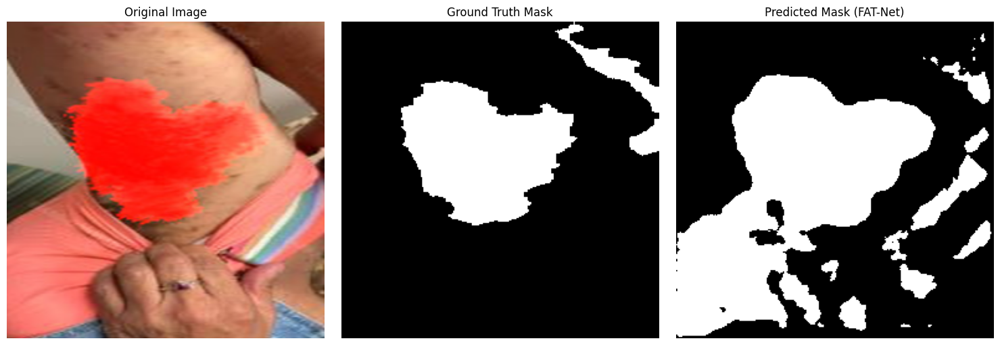

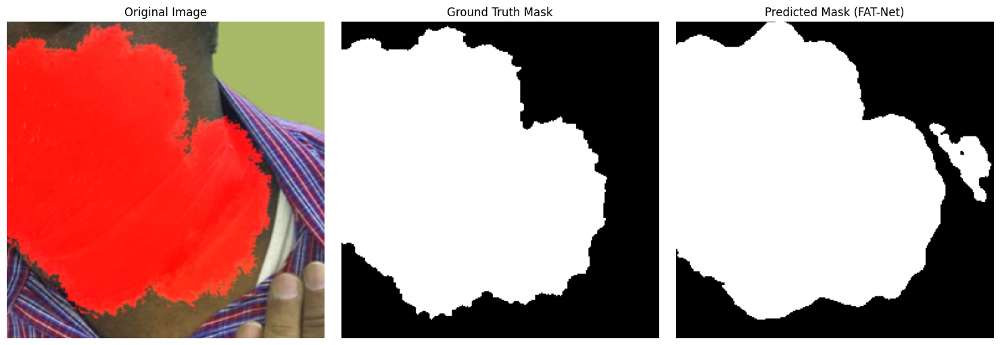

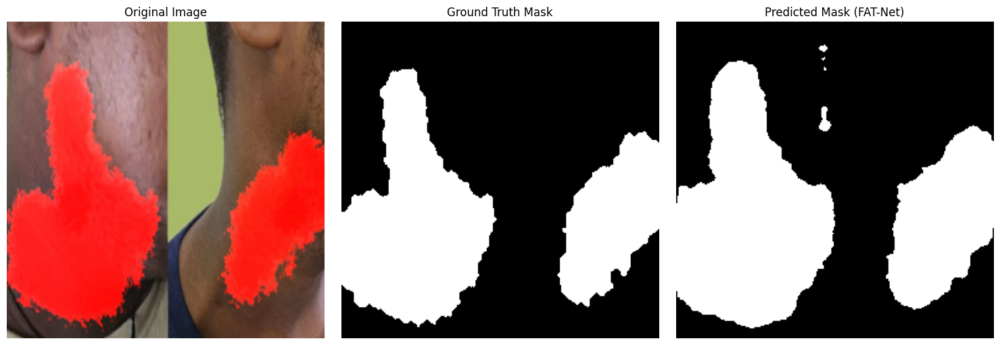

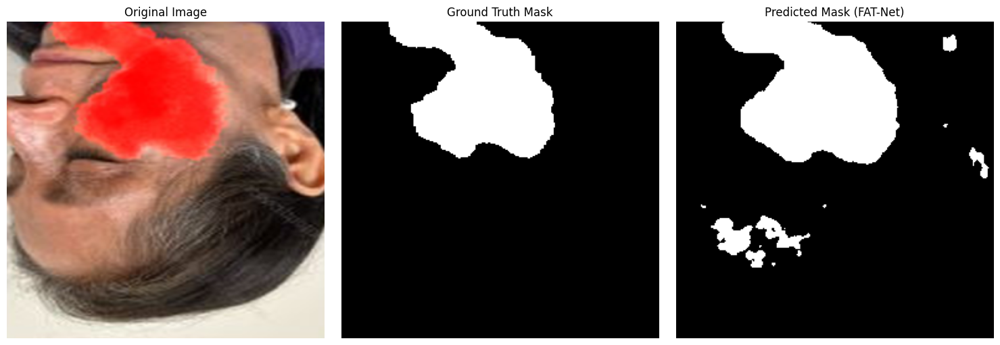

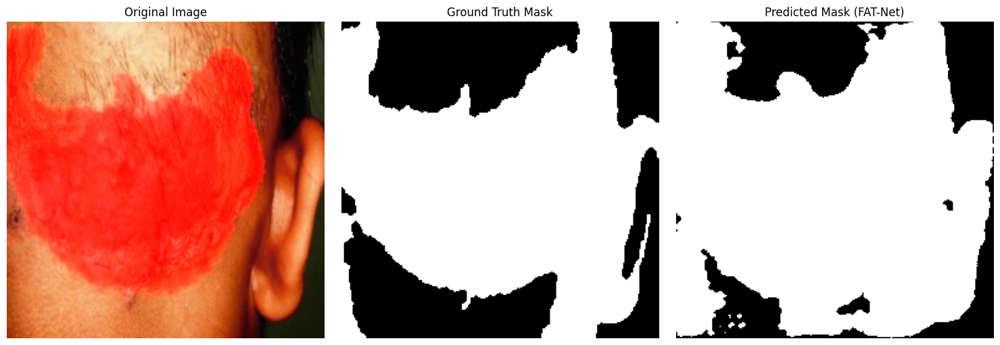

...

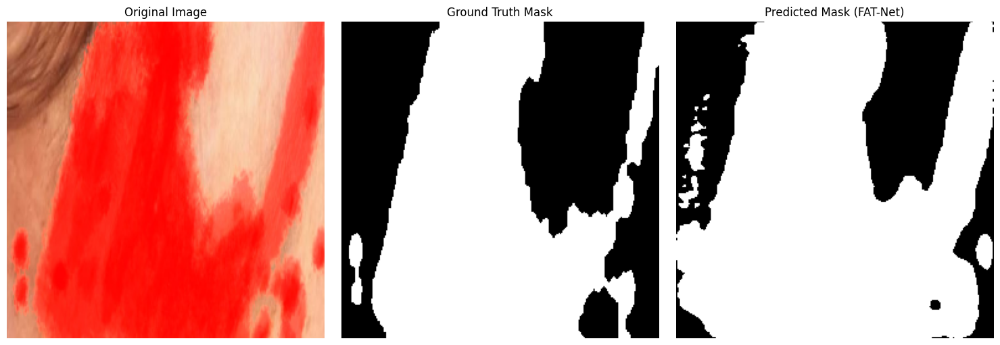

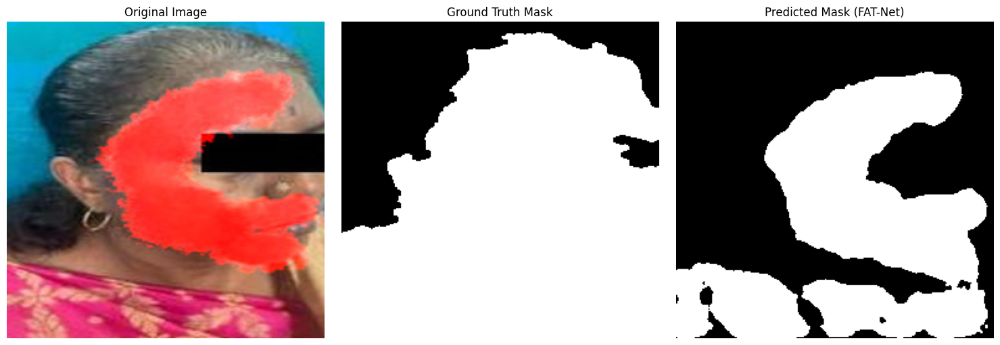

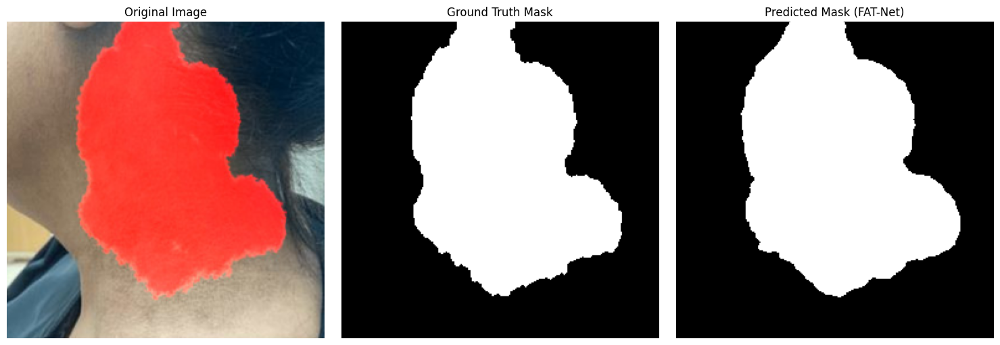

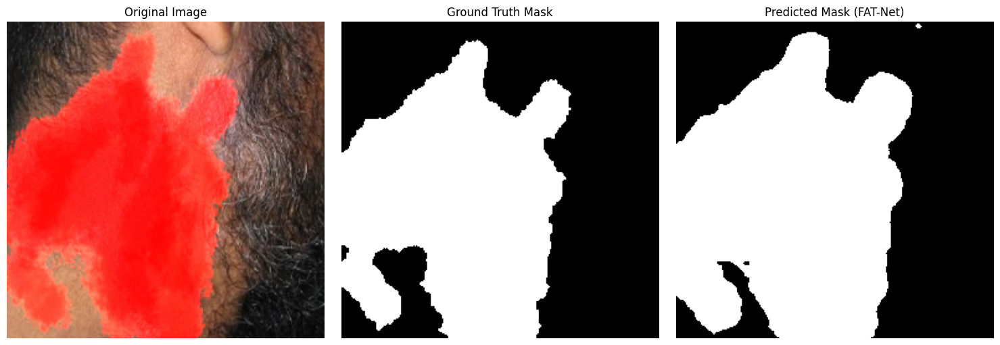

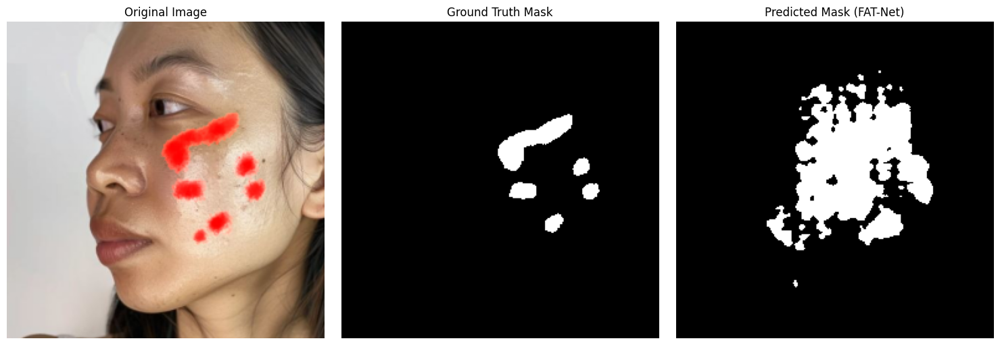

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms

# Function to visualize segmentation for all images in the dataset (training + validation)
def visualize_all_segmentation(dataloader, model, device, thr=0.5, n_images=4):
    """
    Visualizes the segmentation of the original image, ground truth mask, and predicted mask
    for a batch of images from the DataLoader.

    Parameters:
        dataloader (DataLoader): The DataLoader to fetch images and masks.
        model (nn.Module): The trained model to get predictions.
        device (torch.device): The device (CPU or GPU) to perform computations.
        thr (float): The threshold for binarizing the predicted mask.
        n_images (int): Number of images to visualize in a batch.
    """
    model.eval()  # Set model to evaluation mode
    model = model.to(device)  # Ensure the model is on the correct device
    with torch.no_grad():  # Disable gradient computation
        for imgs, msks, names in dataloader:
            imgs = imgs.to(device)
            msks = msks.to(device)

            # Get predictions from the model
            predicted_mask = model(imgs)

            # Loop through the images and visualize
            for i in range(min(n_images, imgs.size(0))):  # Visualize n_images images
                img = imgs[i]
                ground_truth_mask = msks[i]
                predicted_mask_single = predicted_mask[i]

                # Visualize segmentation
                visualize_segmentation(img, ground_truth_mask, predicted_mask_single, thr=thr)

# Visualization function for a single image
@torch.no_grad()
def visualize_segmentation(img, ground_truth_mask, predicted_mask, thr=0.5):
    """
    Visualize the original image, ground truth mask, and predicted mask from FAT-Net.

    Parameters:
        img (Tensor): The original image (C, H, W).
        ground_truth_mask (Tensor): The ground truth mask (1, H, W).
        predicted_mask (Tensor): The predicted mask (1, H, W).
        thr (float): The threshold for binarizing the predicted mask.
    """
    # Convert tensors to numpy arrays for visualization
    img = img.permute(1, 2, 0).cpu().numpy()  # Convert from (C, H, W) to (H, W, C)

    # Squeeze both the ground truth and predicted masks
    ground_truth_mask = ground_truth_mask.squeeze(0).cpu().numpy()  # Convert from (1, H, W) to (H, W)
    predicted_mask = (torch.sigmoid(predicted_mask) > thr).cpu().numpy().squeeze()  # Apply threshold and convert

    # Plot original image, ground truth mask, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original Image
    axes[0].imshow(img)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Ground Truth Mask
    axes[1].imshow(ground_truth_mask, cmap="gray")
    axes[1].set_title("Ground Truth Mask")
    axes[1].axis("off")

    # Predicted Mask
    axes[2].imshow(predicted_mask, cmap="gray")
    axes[2].set_title("Predicted Mask (FAT-Net)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Combine both training and validation dataloaders for visualization
combined_dl = torch.utils.data.ConcatDataset([train_ds, val_ds])  # Combine training and validation datasets
combined_dataloader = DataLoader(combined_dl, batch_size=BATCH_SIZE, shuffle=False)

# Example usage:
# Assuming `train_dl` is your training DataLoader, `val_dl` is your validation DataLoader,
# and `model` is your trained FAT-Net model, call the function with device="cpu"
visualize_all_segmentation(combined_dataloader, model, device="cpu", thr=0.5, n_images=4)


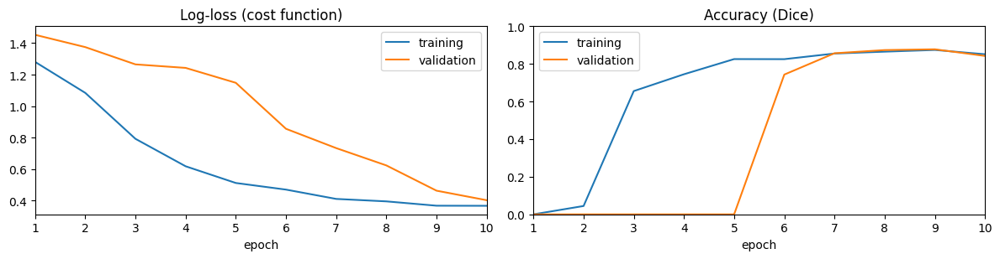

Figure saved to: /content/drive/MyDrive/dataset3/training_curves.png


In [ ]:
import re
import matplotlib.pyplot as plt
import os

# Paste your printed training log here
log_text = """
[01/10] train_loss=1.2809 dice=0.0000 | val_loss=1.4530 dice=0.0000 (best=0.0000)
[02/10] train_loss=1.0840 dice=0.0444 | val_loss=1.3749 dice=0.0000 (best=0.0000)
[03/10] train_loss=0.7920 dice=0.6554 | val_loss=1.2651 dice=0.0000 (best=0.0000)
[04/10] train_loss=0.6175 dice=0.7448 | val_loss=1.2428 dice=0.0000 (best=0.0000)
[05/10] train_loss=0.5113 dice=0.8255 | val_loss=1.1480 dice=0.0000 (best=0.0000)
[06/10] train_loss=0.4692 dice=0.8251 | val_loss=0.8557 dice=0.7431 (best=0.7431)
[07/10] train_loss=0.4100 dice=0.8550 | val_loss=0.7330 dice=0.8565 (best=0.8565)
[08/10] train_loss=0.3944 dice=0.8650 | val_loss=0.6229 dice=0.8734 (best=0.8734)
[09/10] train_loss=0.3669 dice=0.8741 | val_loss=0.4624 dice=0.8776 (best=0.8776)
[10/10] train_loss=0.3663 dice=0.8512 | val_loss=0.4018 dice=0.8423 (best=0.8776)

""".strip()

# Regex to extract metrics
pat = re.compile(
    r"\[(\d+)\s*/\s*(\d+)\]\s*train_loss=([0-9.]+)\s*dice=([0-9.]+)\s*\|\s*val_loss=([0-9.]+)\s*dice=([0-9.]+)"
)

rows = [(int(m[1]), int(m[2]), float(m[3]), float(m[4]), float(m[5]), float(m[6]))
        for m in pat.finditer(log_text)]
rows.sort(key=lambda x: x[0])

epochs = [r[0] for r in rows]
Tloss  = [r[2] for r in rows];  Vloss = [r[4] for r in rows]
Tacc   = [r[3] for r in rows];  Vacc  = [r[5] for r in rows]
E = rows[0][1]

# --- Plot both subplots in one figure ---
fig, axes = plt.subplots(1, 2, figsize=(12, 3.2))

# Log-loss
axes[0].plot(epochs, Tloss, label="training")
axes[0].plot(epochs, Vloss, label="validation")
axes[0].set_title("Log-loss (cost function)")
axes[0].set_xlabel("epoch"); axes[0].set_xlim(1, E); axes[0].legend()

# Accuracy (Dice)
axes[1].plot(epochs, Tacc, label="training")
axes[1].plot(epochs, Vacc, label="validation")
axes[1].set_title("Accuracy (Dice)")
axes[1].set_xlabel("epoch"); axes[1].set_xlim(1, E)
axes[1].set_ylim(0.0, 1.0); axes[1].legend()

plt.tight_layout()
plt.show()

# --- Save figure to Drive ---
save_path = "/content/drive/MyDrive/dataset3/training_curves.png"
fig.savefig(save_path, dpi=150)
print("Figure saved to:", save_path)


In [ ]:
# (Optional) Avoid forcing CPU-only PyTorch unless you specifically want it:
!pip uninstall -y torch torchvision torchaudio
!pip install --no-cache-dir --force-reinstall -U \
torch torchvision torchaudio \
--index-url https://download.pytorch.org/whl/cpu


Found existing installation: torch 2.8.0+cu126
Uninstalling torch-2.8.0+cu126:
  Successfully uninstalled torch-2.8.0+cu126
Found existing installation: torchvision 0.23.0+cu126
Uninstalling torchvision-0.23.0+cu126:
  Successfully uninstalled torchvision-0.23.0+cu126
Found existing installation: torchaudio 2.8.0+cu126
Uninstalling torchaudio-2.8.0+cu126:
  Successfully uninstalled torchaudio-2.8.0+cu126
Looking in indexes: https://download.pytorch.org/whl/cpu
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 148.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 MB 167.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 218.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 238.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 230.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 240